In [160]:
using JuMP, HiGHS, PlotlyJS, DataFrames, CSV, Gurobi

In [113]:
generators = CSV.read("Data/CostsData.csv",DataFrame)
G = generators.Gen;
to_use = names(generators)[.!occursin.("KW",names(generators)).&.!occursin.("Gen",names(generators))]

G_rve = G[occursin.("Wind",G) .| occursin.("Solar",G)]
G_bess = G[occursin.("BESS",G)]
G_conv = G[G.∉ Ref([G_rve;G_bess])]


gen_data = Dict()
for column in to_use
    colname = split(column)[1]
    gen_data[colname] = JuMP.Containers.DenseAxisArray(generators[!,column],G)
end

In [192]:
gen_data

Dict{Any, Any} with 8 entries:
  "Ramping"        => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "CAPEX"          => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "HeatRate"       => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "OM"             => 1-dimensional DenseAxisArray{Int64,1,...} with index sets…
  "VarOM"          => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "FuelCost"       => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "CO2"            => 1-dimensional DenseAxisArray{Float64,1,...} with index se…
  "CapacityFactor" => 1-dimensional DenseAxisArray{Float64,1,...} with index se…

In [60]:
capacity_df = CSV.read("Data/TMY_uk_erv.csv",DataFrame)
cap_names = ["OnshoreWind","OffshoreWind","Solar"]
cf = Dict()
for col in cap_names
    cf[col] = JuMP.Containers.DenseAxisArray(capacity_df[!,col],H)
end

In [95]:
existing = CSV.read("Data/UK_GenMix_2022.csv",DataFrame)
cap_0 = JuMP.Containers.DenseAxisArray(existing.CAP,existing.Gen);
tau = JuMP.Containers.DenseAxisArray([2,6,10],G_bess);

In [468]:
D = CSV.read("Data/demanddata_2022.csv",DataFrame).ND;
date = CSV.read("Data/demanddata_2022.csv",DataFrame).Date;
H = 1:length(D);
VoLL = 20000;

In [126]:
G_conv;G_rve

3-element Vector{String15}:
 "OnshoreWind"
 "OffshoreWind"
 "Solar"

In [462]:
ExpansionModel = Model(Gurobi.Optimizer)
@variables(ExpansionModel, begin
    cap[g in G] >=0
    gen[g in [G_conv;G_rve], t in H] >=0
    nse[t in H]>=0
    soe[g in G_bess, t in H] >= 0
    charge[g in G_bess, t in H] >= 0
    discharge[g in G_bess, t in H] >= 0
end)

@constraints(ExpansionModel, begin
    demandSupply[t in H], sum(gen[g,t] for g in [G_conv;G_rve]) + sum((discharge[g,t]-charge[g,t]) for g in G_bess) + nse[t] == 1.6*D[t]

    newCap[g in G], cap[g] >= 0
    
    capacityConstraintRen[g in G_rve, t in H], gen[g,t] <= (cap[g]+cap_0[g]) * cf[g][t]
    capacityConstraintConv[g in G_conv, t in H], gen[g,t] <= (cap[g]+cap_0[g]) * gen_data["CapacityFactor"][g]

    nonFlexNuclear[t in H], gen["Nuclear",t] == (cap["Nuclear"]+cap_0["Nuclear"])*gen_data["CapacityFactor"]["Nuclear"]
    
    soeConstraint[g in G_bess, t in H; t<8760], soe[g,t+1] == soe[g,t]+(charge[g,t]*0.85-discharge[g,t]/0.85)
    soeInitial[g in G_bess, t in [1,8760]], soe[g,t] == 0.5*(cap[g]+cap_0[g])*tau[g]
    soeLimit[g in G_bess, t in H], soe[g,t] <= (cap[g]+cap_0[g])*tau[g]
    chargeLimit[g in G_bess, t in H], charge[g,t] <= (cap[g]+cap_0[g])
    dischargeLimit[g in G_bess, t in H], discharge[g,t] <= (cap[g]+cap_0[g])

    initial_discharge[g in G_bess], discharge[g,1] <= soe[g,1]
    initial_charge[g in G_bess], charge[g,1] <= (cap[g]+cap_0[g])-soe[g,1]
    

    rampUp[g in [G_conv;G_rve], t in H; 1<t], gen[g,t]-gen[g,t-1] <= gen_data["Ramping"][g]*cap[g]
    rampDown[g in [G_conv;G_rve], t in H; 1<t], gen[g,t-1]-gen[g,t] <= gen_data["Ramping"][g]*cap[g]
end)

@objective(ExpansionModel, Min, sum(
    (gen_data["OM"][g]+gen_data["CAPEX"][g])*(cap[g]) for g in G)+
    sum((gen_data["VarOM"][g]+gen_data["HeatRate"][g]*gen_data["FuelCost"][g])*gen[g,t] for g in [G_conv;G_rve], t in H)+
    sum(VoLL*nse[t] for t in H) + sum((100/1000)*gen_data["HeatRate"][g]*gen_data["CO2"][g]*gen[g,t] for g in G_conv, t in H)
)

optimize!(ExpansionModel)


Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-12
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 11+.0 (22631.2))

CPU model: 13th Gen Intel(R) Core(TM) i7-1360P, instruction set [SSE2|AVX|AVX2]
Thread count: 12 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 359163 rows, 166452 columns and 1030057 nonzeros
Model fingerprint: 0xc3d53034
Coefficient statistics:
  Matrix range     [1e-04, 1e+01]
  Objective range  [9e+00, 8e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+04]
Presolve removed 115992 rows and 64923 columns
Presolve time: 0.89s
Presolved: 84012 rows, 243171 columns, 728700 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.06s

Barrier statistics:
 Free vars  : 2
 AA' NZ     : 6.798e+05
 Factor NZ  : 2.766e+06 (roughly 150 MB of memory)
 Factor Ops : 9.844e+07 (less than 1 second per ite

In [463]:
useful_g = Dict("Conv"=>[],"RVE"=>[],"BESS"=>[])
for g in [G_conv;G_rve]
    if sum(value.(gen[g,:])) > 10
        if g in G_conv
            push!(useful_g["Conv"],g)
        elseif g in G_rve
            push!(useful_g["RVE"],g)
        else
            push!(useful_g["BESS"],g)
        end
    end
    println(g,": ",value(cap[g]), " MW")
end
for g in G_bess
    if sum(value.(discharge[g,:]) ) > 0 || sum(value.(charge[g,:])) > 0
        push!(useful_g["BESS"],g)
    end
    println(g,": ",value(cap[g]), " MW")
end

Nuclear: 0.0 MW
Coal: 56.38297872340426 MW
Gas-CC: 4226.835600402406 MW
Gas-CT: 628.3882379971544 MW
Gas-CCS-95: 0.0 MW
Gas-CCS-97: 18248.517118737433 MW
OnshoreWind: 948.9391668021739 MW
OffshoreWind: 521.7078537294832 MW
Solar: 2399.6067199309496 MW
BESS-2H: 115.40356873791558 MW
BESS-6H: 0.0 MW
BESS-10H: 0.0 MW


In [464]:
sum(value.(nse)[:])

279.09182523408947

In [465]:
conv = [scatter(x=date, y=value.(gen)[g,:].data, mode="lines", name=g, stackgroup="one",line_shape="hv") for g in useful_g["Conv"]]
rve = [scatter(x=date, y=value.(gen)[g,:].data, mode="lines", name=g, stackgroup="one",line_shape="hv") for g in useful_g["RVE"]]
bess_dch = [scatter(x=date, y=value.(discharge)[g,:].data, mode="lines", name=g*"dchg", stackgroup="one",line_shape="hv") for g in useful_g["BESS"]]
bess_ch = [scatter(x=date, y=-value.(charge)[g,:].data, mode="lines", name=g*"chg", stackgroup="one",line_shape="hv") for g in useful_g["BESS"]]


1-element Vector{GenericTrace{Dict{Symbol, Any}}}:
 GenericTrace{Dict{Symbol, Any}}(Dict{Symbol, Any}(:mode => "lines", :line => Dict{Any, Any}(:shape => "hv"), :y => [-0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0  …  -115.40356873791558, -0.0, -0.0, -29.252577712379964, -0.0, -0.0, -104.79935387392203, -0.0, -115.40356873791558, -0.0], :type => "scatter", :name => "BESS-2Hchg", :stackgroup => "one", :x => String31["2022-01-01 00:00:00", "2022-01-01 01:00:00", "2022-01-01 02:00:00", "2022-01-01 03:00:00", "2022-01-01 04:00:00", "2022-01-01 05:00:00", "2022-01-01 06:00:00", "2022-01-01 07:00:00", "2022-01-01 08:00:00", "2022-01-01 09:00:00"  …  "2022-12-31 14:00:00", "2022-12-31 15:00:00", "2022-12-31 16:00:00", "2022-12-31 17:00:00", "2022-12-31 18:00:00", "2022-12-31 19:00:00", "2022-12-31 20:00:00", "2022-12-31 21:00:00", "2022-12-31 22:00:00", "2022-12-31 23:00:00"]))

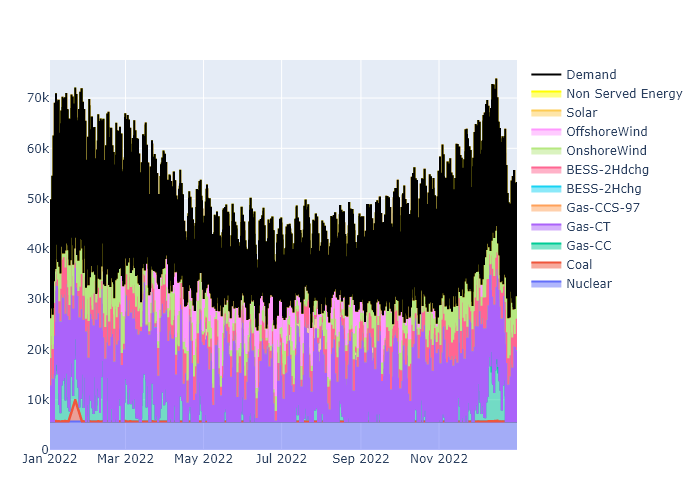

In [466]:
plot([conv;bess_ch;bess_dch;rve;
scatter(x=date, y=value.(nse)[:].data, mode="lines", name="Non Served Energy",line_shape="hv", stackgroup="one",line=attr(color="yellow"));
scatter(x=date, y=D.*1.6, mode="lines", name="Demand",line_shape="hv", line=attr(color="black"))])

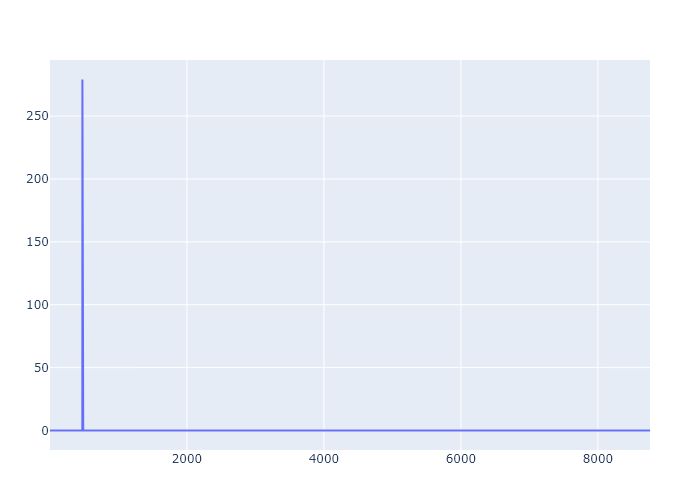

In [467]:
plot(value.(nse)[:].data)

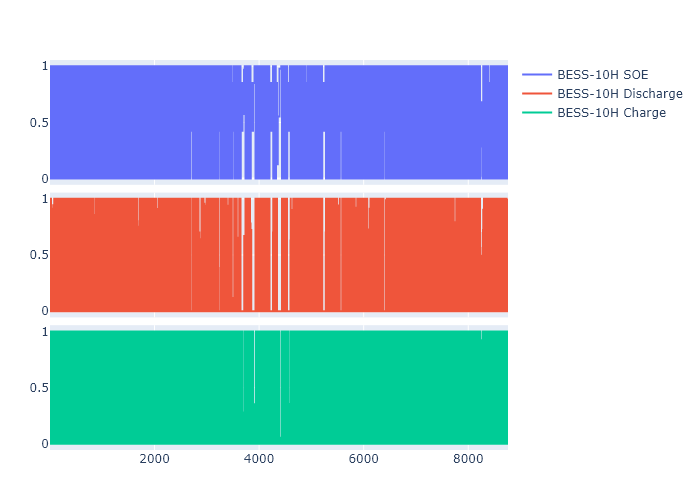

In [424]:
p = make_subplots(rows=3, cols=1, shared_xaxes=true, vertical_spacing=0.02)
add_trace!(p,scatter(x=H, y=value.(soe)["BESS-2H",:].data/(value.(cap)["BESS-2H"]*tau["BESS-2H"]), mode="lines", name="BESS-10H SOE",line_shape="hv"), row=1, col=1)
add_trace!(p,scatter(x=H, y=value.(discharge)["BESS-2H",:].data/(value.(cap)["BESS-2H"]), mode="lines", name="BESS-10H Discharge",line_shape="hv"), row=2, col=1)
add_trace!(p,scatter(x=H, y=value.(charge)["BESS-2H",:].data/(value.(cap)["BESS-2H"]), mode="lines", name="BESS-10H Charge",line_shape="hv"), row=3, col=1)
p